# Self-Driving Car Engineer Nanodegree

## Project: Build a Traffic Sign Recognition Classifier

---
## Overview
The goal of this project is to build a convolution neural network in Keras that clones a driver's behavior and predicts steering angles from images. The model I built could successfully drive around track one without leaving the road. The following animation shows how the car drives on the lake side track.

[Animation Place holder]()

My project includes the following files:

`model.py` containing the script to create and train the model  
`utils.py` containing all the utilities functions  
`drive.py` for driving the car in autonomous mode  
`model.h5` containing a trained convolution neural network  
`README.md` summarizing the results  


In [1]:
"""
Finding the correction matrix and distortion coefficients
"""

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
image_names = glob.glob('camera_cal/calibration*.jpg')
image_names.sort()

# Step through the list and search for chessboard corners
for idx, fname in enumerate(image_names):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_size = (img.shape[1], img.shape[0])
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (8,6), corners, ret)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

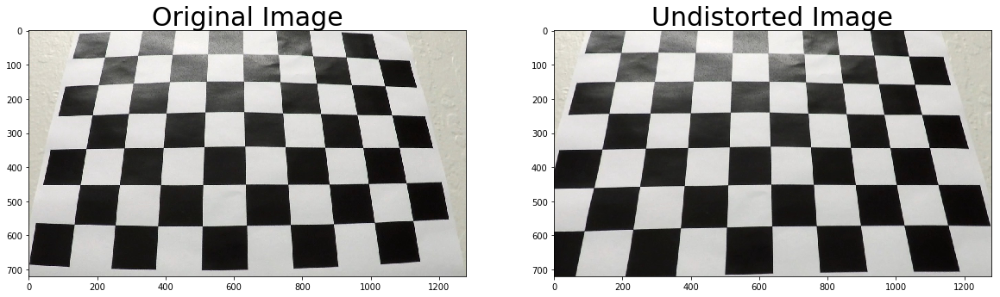

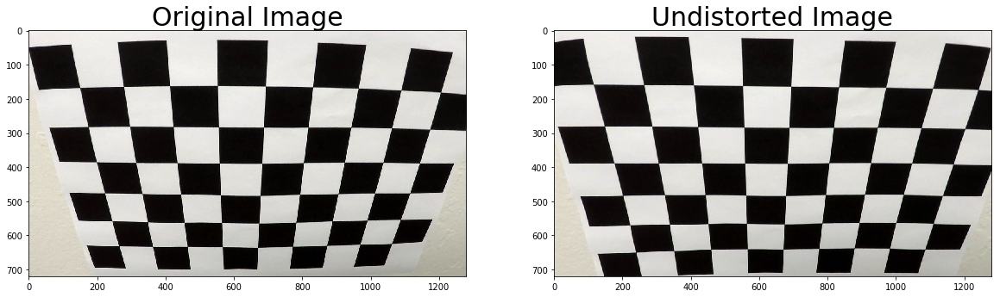

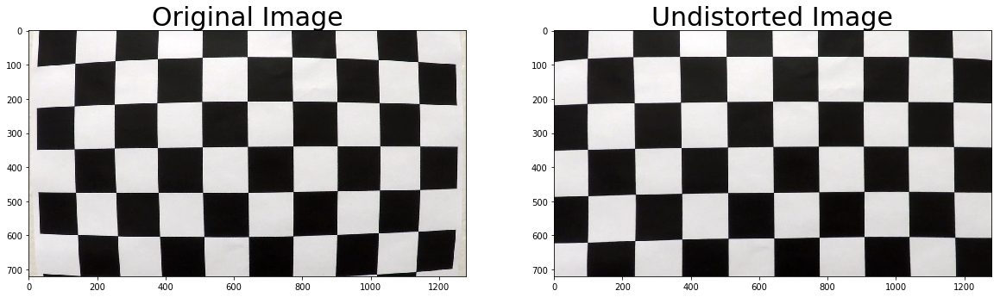

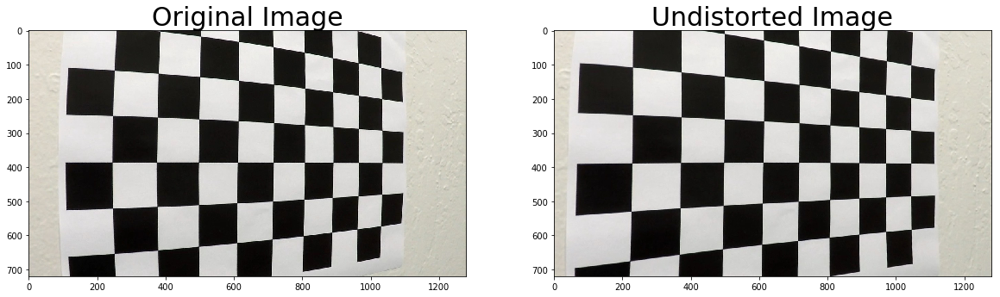

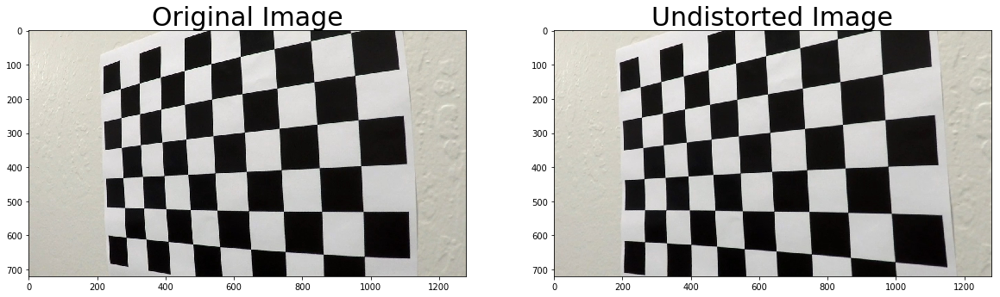

In [2]:
"""
Undistort the images
"""

import pickle
import os
%matplotlib inline

def undistort(mtx, dist, img_in_path, img_out_path='', plot=False):
    # Test undistortion on an image
    img = cv2.imread(img_in_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if img_out_path:
        cv2.imwrite(img_out_path,dst)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return dst

image_in_folder = 'camera_cal/'
image_out_folder = 'camera_cal_output/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
chessboard_undists = []
for file in files:
    chessboard_undists.append(undistort(mtx,dist,
                              os.path.join(image_in_folder,file),
                              os.path.join(image_out_folder,file),
                              plot=True))

In [3]:
# X,Y
img_size = (1280, 720)
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
            
# MMa 2017-06-27 Why it failed immediately when top source points are less then half of the height ??!
src = np.float32([ [img_size[0]/2-116,img_size[1]/2+150],
                    [img_size[0]/2+116,img_size[1]/2+150],
                    [img_size[0]/2+320,img_size[1]],
                    [img_size[0]/2-320,img_size[1]]])

offset_x = 300 # offset for dst points
offset_y = 400
dst = np.float32([ [offset_x, offset_y], 
                    [img_size[0]-offset_x, offset_y], 
                    [img_size[0]-offset_x, img_size[1]], 
                    [offset_x, img_size[1]]])

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
ploty = np.linspace(0, img_size[1]-1, img_size[1]/10 )

/home/mma/miniconda3/envs/carnd-term1-cpu/lib/python3.5/site-packages/ipykernel_launcher.py:22: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.


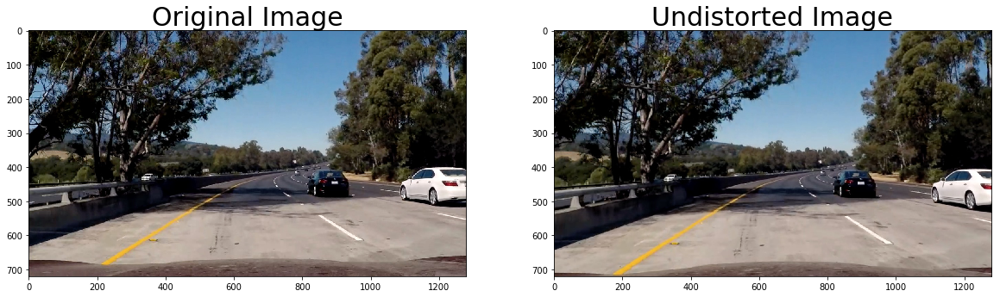

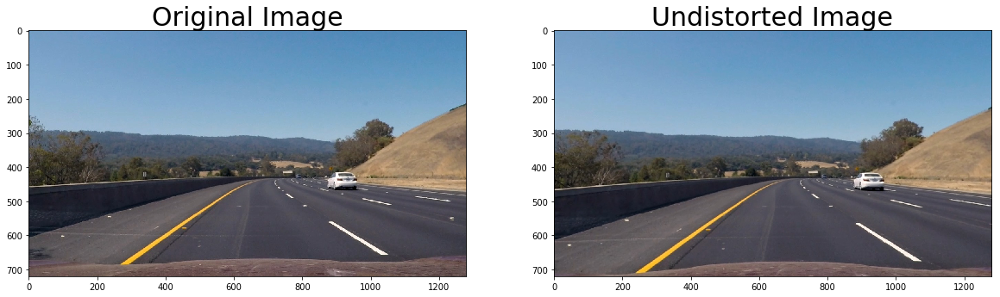

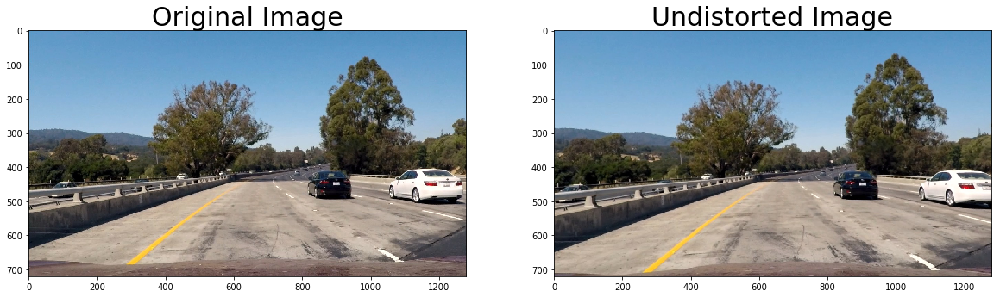

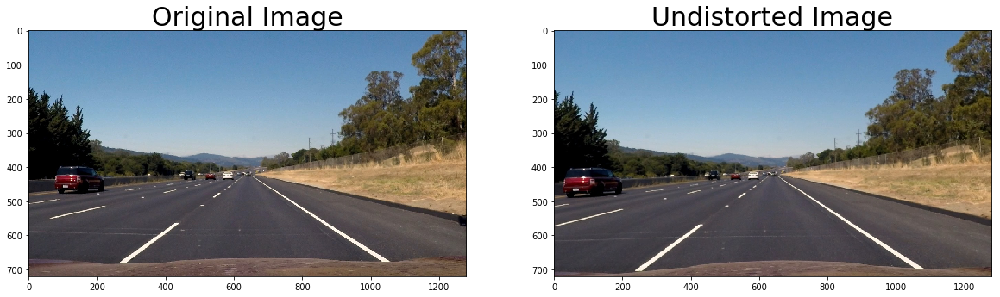

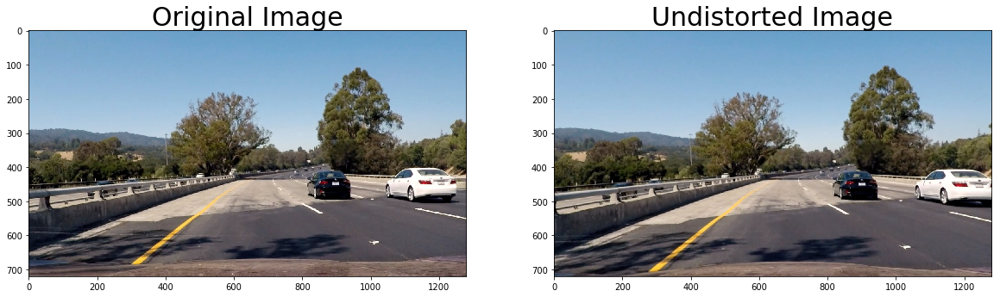

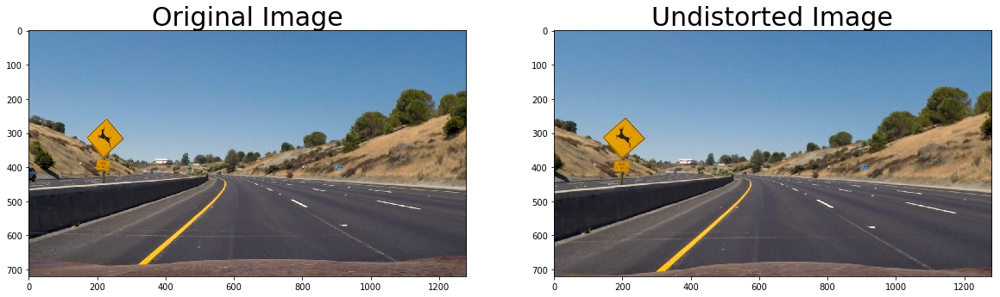

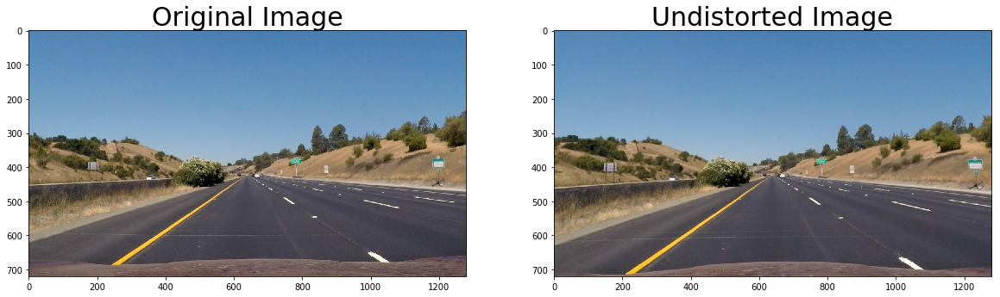

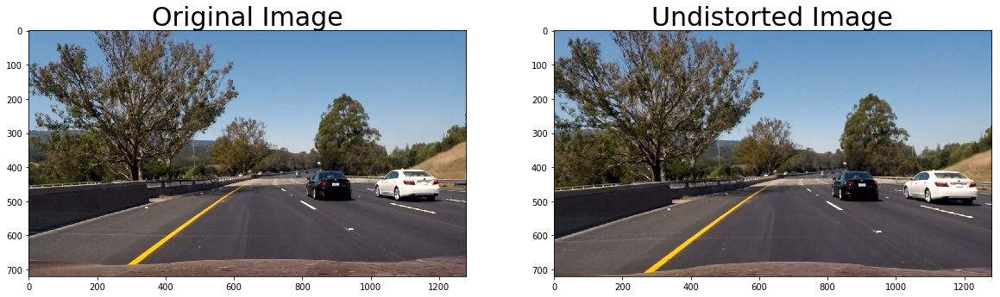

In [7]:
image_in_folder = 'test_images/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
images = []
for file in files:
    images.append(undistort(mtx,dist,
                            os.path.join(image_in_folder,file),
                            plot = True))

<function __main__.test_dir>

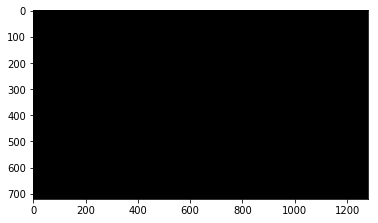

In [4]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_dir(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    plt.imshow(dir_bin,cmap='gray')

    #dir_bin = utils.dir_thresh(img_test,15,thresh=(0.73, 1.16))
interact(test_dir,kernel_size=(1,31,2), 
         thresh_min=(0,np.pi/2,0.01), 
         thresh_max=(0,np.pi/2,0.01))

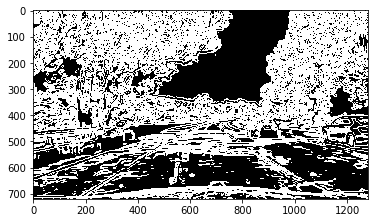

In [5]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_mag(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    mag_bin = utils.mag_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    mag_bin = utils.mag_thresh(img_test,kernel_size, thresh=(8, 72))
    plt.imshow(mag_bin,cmap='gray')

interact(test_mag,kernel_size=(1,31,2), 
         thresh_min=(0,50), 
         thresh_max=(0,100))

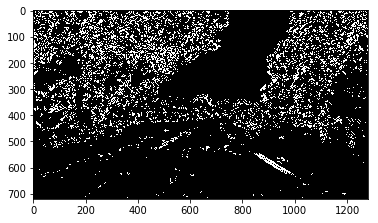

In [7]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
def test_mag_dir( mag_min_thresh, mag_max_thresh, 
                  dir_min_thresh, dir_max_thresh):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test, 15, thresh=(dir_min_thresh, dir_max_thresh))
    mag_bin = utils.mag_thresh(img_test, 15, thresh=(mag_min_thresh, mag_max_thresh))
    combined = np.zeros_like(dir_bin)
    combined[((dir_bin == 1) & (mag_bin == 1))] = 1
    plt.imshow(combined,cmap='gray')

interact(test_mag_dir,
         mag_min_thresh=(0,255), 
         mag_max_thresh=(0,255),
         dir_min_thresh=(0,np.pi/2,0.01), 
         dir_max_thresh=(0,np.pi/2,0.01))

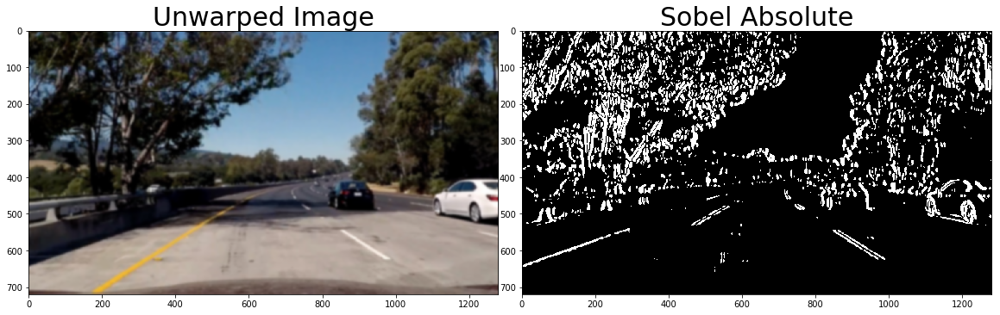

In [9]:
def test_abs_thresh(kernel_size, min_thresh, max_thresh):
    img_test = utils.gaussian_blur(images[0],kernel_size)
    test_out = utils.abs_sobel_thresh(img_test, 'x',
                                     thresh=(min_thresh, max_thresh))
    # Visualize sobel absolute threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(test_out, cmap='gray')
    ax2.set_title('Sobel Absolute', fontsize=30)
    
# kernel 9, min 18, max 255
interact(test_abs_thresh,
         kernel_size=(1,31,2),
         min_thresh=(0,100,1), 
         max_thresh=(0,255))

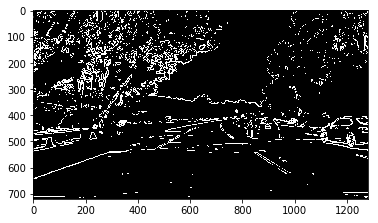

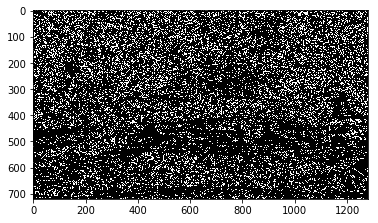

In [16]:
# for image in images:
image = images[0]
image_new = pipeline1(image)

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(image_new,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



In [9]:
import utils

def poly_fit(img):
    print("Initial search")
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines

    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
#     print("left base {},right base {}".format(leftx_base,rightx_base))

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
#     print("Using window height {}".format(window_height))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

#         # Draw the windows on the visualization image
#         cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
#         cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
#     print(left_fit)
#     print(right_fit)
    return left_fit, right_fit


def poly_fit_update(img, left_fit, right_fit):
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                     (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                        (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit


def curvature(ploty,leftx,rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
#     print(left_fit_cr[0]*y_eval*ym_per_pix, 'm', right_fit_cr[0]*y_eval*ym_per_pix, 'm')
    return left_curverad,right_curverad

def draw_lane(img,ploty,left_fitx,right_fitx):
    img_new = img.copy()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = warp_zero #np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    img_new = cv2.addWeighted(img_new, 1, newwarp, 0.3, 0)
    return img_new

def draw_info(img, curv_l, curv_r, dist_l,dist_r):
    img_new = np.copy(img)
    h = img_new.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Curvature Left : {:4.2f}'.format(curv_l) + 'm'
    cv2.putText(img_new, text, (40,70), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Curvature right : {:4.2f}'.format(curv_r) + 'm'
    cv2.putText(img_new, text, (40,100), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Distance to left : {:4.2f}'.format(dist_l) + 'm'
    cv2.putText(img_new, text, (40,130), font, 1, (255,255,255), 2, cv2.LINE_AA)
    text = 'Distance to left : {:4.2f}'.format(dist_r) + 'm'
    cv2.putText(img_new, text, (40,160), font, 1, (255,255,255), 2, cv2.LINE_AA)
    return img_new

def get_poly_point(poly,x):
    return poly[0]*x*x+poly[1]*x+poly[2]

In [76]:
def select(img):
    filtered = utils.gaussian_blur(img,9)
    s = utils.hls_select(filtered,thresh=(100, 255))
    
    grad_x= utils.abs_sobel_thresh(filtered, 'x',thresh=(32, 255))
    grad_y= utils.abs_sobel_thresh(filtered, 'y',thresh=(32, 255))
    
    dir_bin = utils.dir_thresh(filtered,15, thresh=(0.63, 1.))
    mag_bin = utils.mag_thresh(filtered,15, thresh=(70, 78))

    combined = np.zeros_like(mag_bin)
    combined[((grad_x == 1) ) | 
             ((mag_bin == 1) & (dir_bin == 1)) |
             s > 0] = 1
    
    return combined

def pipeline(img):
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    img_bin = select(undistort)
    warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
    
    if l_line.best_fit == None or r_line.best_fit == None:
        left_fit,right_fit = poly_fit(warped)
    else:
        left_fit,right_fit = poly_fit_update(warped,l_line.best_fit,r_line.best_fit)
     
    l_line.add_poly_fit(left_fit)
    r_line.add_poly_fit(right_fit)
    
    
    # Generate x and y values for plotting
    left_fitx = l_line.best_fit[0]*ploty**2 + l_line.best_fit[1]*ploty + l_line.best_fit[2]
    right_fitx = r_line.best_fit[0]*ploty**2 + r_line.best_fit[1]*ploty + r_line.best_fit[2]
    
    result = draw_lane(undistort,ploty,left_fitx,right_fitx)
    result = draw_info(result,l_line.radius_of_curvature,r_line.radius_of_curvature,
                       l_line.line_base_pos,r_line.line_base_pos)
    return result

# Define a class to receive the characteristics of each line detection

class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.momemtum = 0.4 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        self.diffs_sum = np.array([0,0,0], dtype='float') 
        self.test_count = 0
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def add_poly_fit(self,poly_fit):
#         print("poly_fit",poly_fit)
        if poly_fit == None:
            self.detected = False
        else:
            self.detected = True
            
            if self.best_fit == None:
                self.best_fit = poly_fit
                
            self.diffs = abs(poly_fit - self.best_fit)
            self.diffs_sum = self.diffs_sum + self.diffs
            self.test_count = self.test_count +1
#             print(self.diffs)
            if self.diffs[0] > 1.4e-04 or self.diffs[1] > 1.0e-01 or self.diffs[2] > 20. :
                self.detected = False
                momemtum = self.momemtum * 0.2
                print("bad detection",self.diffs)
            else:
                momemtum = self.momemtum
                
            self.best_fit[0] = self.best_fit[0]*(1-momemtum) + poly_fit[0]*momemtum
            self.best_fit[1] = self.best_fit[1]*(1-momemtum) + poly_fit[1]*momemtum
            self.best_fit[2] = self.best_fit[2]*(1-momemtum) + poly_fit[2]*momemtum
#                 print("self.current_fit ",self.current_fit)
    
            # Define y-value where we want radius of curvature
            # I'll choose the maximum y-value, corresponding to the bottom of the image
            y_eval = np.max(ploty)
            self.line_base_pos = abs(get_poly_point(self.best_fit, y_eval)-img_size[0]/2) * xm_per_pix

            # Calculate the new radii of curvature
            self.radius_of_curvature = ((1 +(2*self.best_fit[0]*y_eval*ym_per_pix + self.best_fit[1])**2)**1.5) / np.absolute(2*self.best_fit[0])

    def mean_diff(self):
        return self.diffs_sum/self.test_count

# img_bin = select(images[0])
# warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(img_bin,cmap='gray')
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(warped,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# plt.show()

In [46]:
# Mean polynomial:
# curve road		L 	[  1.18180920e-05   7.80891282e-03   1.51736282e+00]
#             	    R	[  4.46696746e-05   3.21652172e-02   7.67916775e+00]
# straight road	    L 	[  7.57506233e-06   7.05633821e-03   3.65587183e+00]
#             	    R	[  3.13976960e-05   2.05890272e-02   5.05038335e+00]
# different round	L 	[  2.59277283e-05   2.85054620e-02   1.19792455e+01]
# 				    R	[  5.60560312e-05   3.47728916e-02   8.93921383e+00]
# shadow road		L 	[  3.52839926e-05   3.00916186e-02   1.03260225e+01]
# 				    R	[  1.39808593e-04   1.25237837e-01   3.13900015e+01]

Initial search


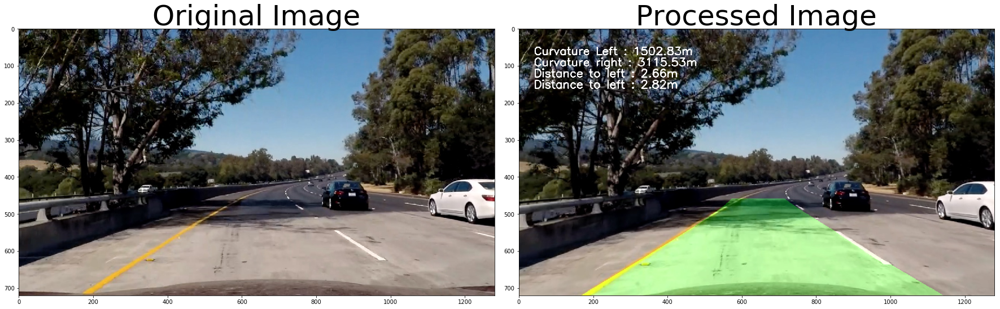

bad detection [  1.24851524e-04   1.96888345e-01   1.32343856e+02]
bad detection [ -1.01759928e-04   4.81635078e-02   5.38884005e+01]


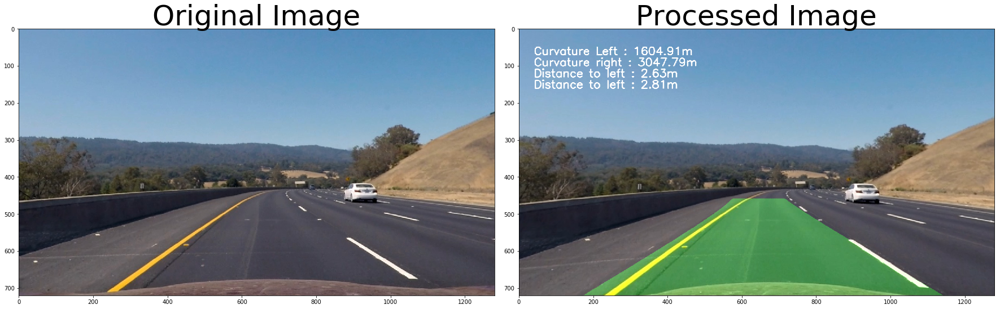

bad detection [  2.09257051e-04   1.93293580e-01   8.73259797e+01]
bad detection [ -9.43895129e-05   7.41501556e-03   3.46726833e+01]


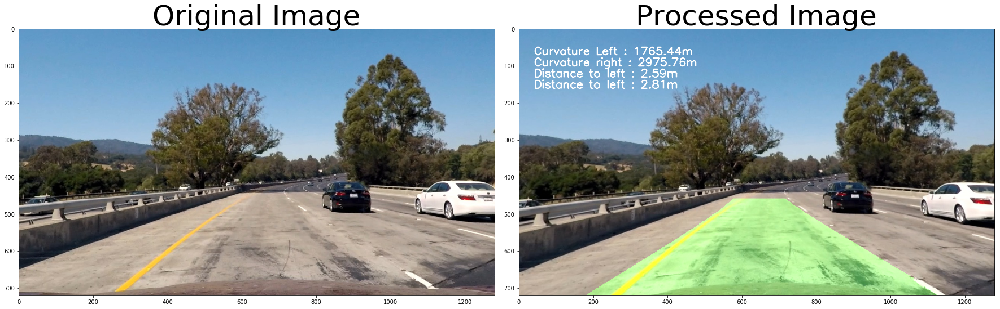

bad detection [  2.36866468e-04   1.70091324e-01   3.22172440e+01]
bad detection [  2.96984450e-05   4.96918505e-02   4.97449463e+01]


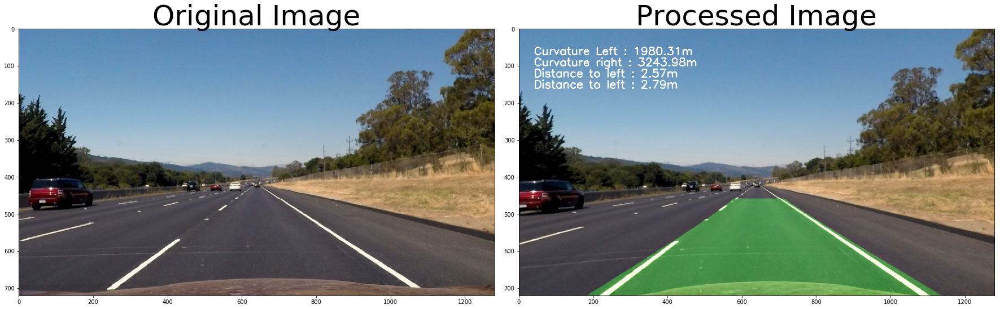

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


bad detection [ -1.59953419e-05   1.63523956e-01   1.16464074e+01]
bad detection [  3.42651843e-04   4.14738996e-01   1.04057251e+02]


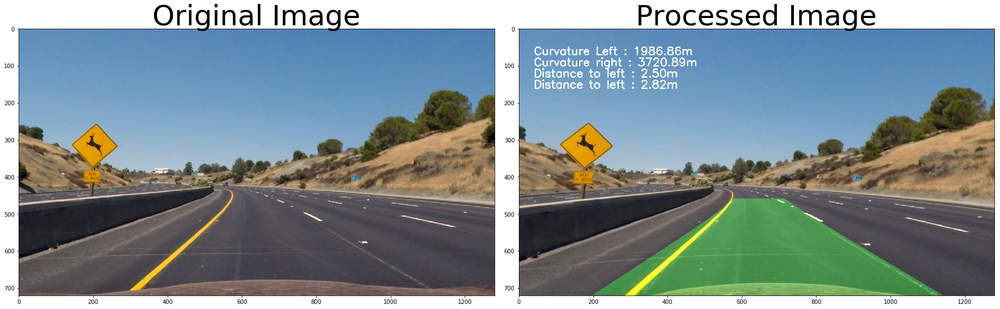

bad detection [  9.71057367e-05   1.01835506e-01   2.28615049e+01]
bad detection [ -1.76482246e-05   1.46907656e-02   5.54585372e+01]


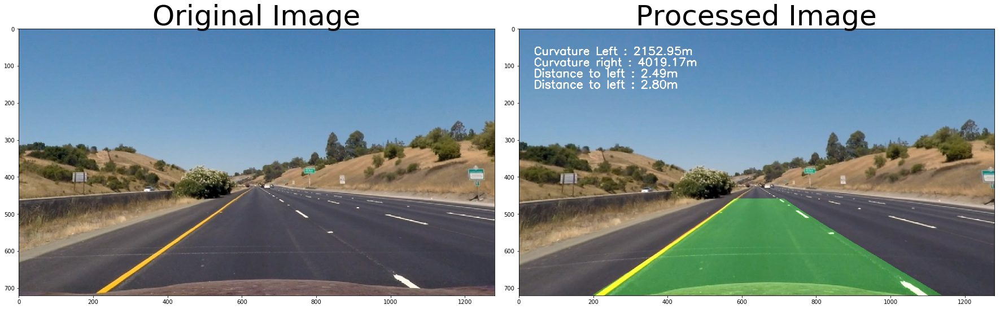

bad detection [  4.91838474e-04   5.10631872e-01   4.53538806e+01]
bad detection [ -6.35930527e-05  -8.35675146e-02   5.88307904e+01]


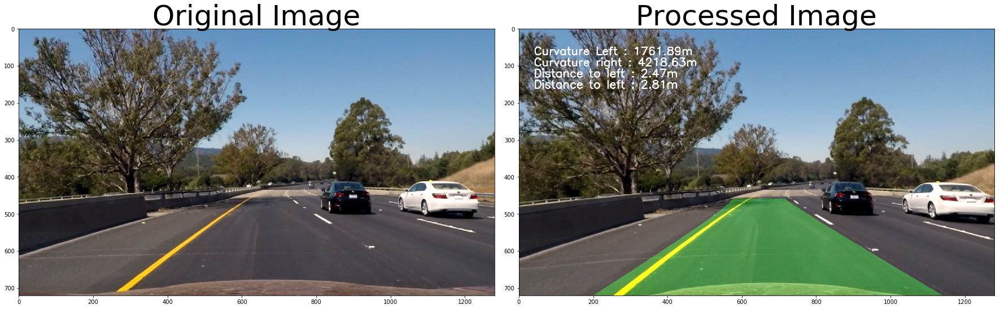

[  2.65465953e-04   2.55629497e-01   6.68681265e+01]
[  1.47804115e-04   1.51107900e-01   6.62696631e+01]


In [64]:
l_line = Line()
r_line = Line()
for image in images:
    image_new = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(image_new)
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    plt.show()
    
print(l_line.mean_diff())
print(r_line.mean_diff())

In [34]:
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
video_output = 'project_video_output.mp4'
video_input = VideoFileClip('project_video.mp4')
processed_video = video_input.fl_image(pipeline)
processed_video.write_videofile(video_output, audio=False)

Initial search
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  0%|          | 6/1261 [00:02<07:26,  2.81it/s]

KeyboardInterrupt: 

In [68]:
"""
Test the change of ground color
"""
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
test_output= 'test1.mp4'
test = VideoFileClip('project_video.mp4').subclip(22,26)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test1.mp4
[MoviePy] Writing video test1.mp4


 10%|▉         | 10/101 [00:03<00:29,  3.14it/s]

bad detection [ -5.11154987e-04  -4.70709940e-01   1.27531770e+01]
bad detection [ -5.28259308e-04  -4.43088868e-01   2.53289844e+01]


 11%|█         | 11/101 [00:03<00:29,  3.05it/s]

bad detection [ -5.20444458e-04  -4.74815405e-01   1.20924646e+01]
bad detection [ -4.33057464e-04  -3.75627526e-01   3.14435678e+01]


 12%|█▏        | 12/101 [00:03<00:30,  2.93it/s]

bad detection [ -5.10414097e-04  -4.40842415e-01   1.77168372e+01]
bad detection [ -4.51334112e-04  -3.84056046e-01   3.47221304e+01]


 14%|█▍        | 14/101 [00:04<00:30,  2.87it/s]

bad detection [ -4.18963227e-04  -3.43211525e-01   2.85165981e+01]


 15%|█▍        | 15/101 [00:05<00:29,  2.90it/s]

bad detection [ -5.37278455e-04  -4.10067225e-01   3.25475113e+01]


 16%|█▌        | 16/101 [00:05<00:29,  2.87it/s]

bad detection [ -4.95697825e-04  -4.29467693e-01   3.99628256e+01]


 17%|█▋        | 17/101 [00:05<00:28,  3.00it/s]

bad detection [ -4.98010919e-04  -3.97843594e-01   3.71656077e+01]


 18%|█▊        | 18/101 [00:06<00:26,  3.10it/s]

bad detection [ -4.52786454e-04  -3.85041517e-01   2.57956070e+01]


 19%|█▉        | 19/101 [00:06<00:26,  3.13it/s]

bad detection [ -2.89072707e-04  -2.85559149e-01   2.05034048e+01]


 20%|█▉        | 20/101 [00:06<00:26,  3.04it/s]

bad detection [ -2.89350768e-04  -2.97962278e-01   6.99312967e+00]


 31%|███       | 31/101 [00:10<00:23,  3.01it/s]

bad detection [ -3.23202443e-05  -1.65388606e-01   1.35361235e+01]


 54%|█████▍    | 55/101 [00:18<00:15,  2.90it/s]

bad detection [ -4.19155099e-04  -3.71992856e-01   5.58723114e+00]


 55%|█████▌    | 56/101 [00:18<00:15,  2.82it/s]

bad detection [ -4.07375278e-04  -3.37013036e-01   2.41915364e+01]


 56%|█████▋    | 57/101 [00:19<00:15,  2.78it/s]

bad detection [ -3.71960363e-04  -3.02702670e-01   3.14830942e+01]


 57%|█████▋    | 58/101 [00:19<00:15,  2.84it/s]

bad detection [ -4.14720089e-04  -3.53515254e-01   9.64805699e+00]


 74%|███████▍  | 75/101 [00:25<00:09,  2.81it/s]

bad detection [ -4.65086819e-04  -3.91392582e-01   2.39079990e+01]


 75%|███████▌  | 76/101 [00:25<00:08,  2.88it/s]

bad detection [ -4.68748400e-04  -4.05510832e-01   1.96452601e+01]


 76%|███████▌  | 77/101 [00:26<00:08,  2.77it/s]

bad detection [ -4.91550088e-04  -4.31713941e-01   9.90839623e+00]


 77%|███████▋  | 78/101 [00:26<00:08,  2.83it/s]

bad detection [ -5.20676186e-04  -4.33508624e-01   2.35775061e+01]


 79%|███████▉  | 80/101 [00:27<00:07,  2.86it/s]

bad detection [ -4.65222968e-04  -4.01979322e-01   7.70477460e+00]


 80%|████████  | 81/101 [00:27<00:07,  2.82it/s]

bad detection [ -4.13272312e-04  -3.41864519e-01   3.28163420e+01]


 81%|████████  | 82/101 [00:28<00:06,  2.88it/s]

bad detection [ -4.36052439e-04  -3.53249314e-01   3.59581017e+01]


 82%|████████▏ | 83/101 [00:28<00:06,  2.86it/s]

bad detection [ -4.22634127e-04  -3.58142005e-01   2.64951541e+01]


 85%|████████▌ | 86/101 [00:29<00:05,  2.94it/s]

bad detection [ -5.25623467e-04  -4.54505182e-01   5.17222203e+00]


 86%|████████▌ | 87/101 [00:29<00:04,  3.00it/s]

bad detection [ -5.30744457e-04  -4.36574595e-01   2.77278727e+01]


 87%|████████▋ | 88/101 [00:30<00:04,  2.88it/s]

bad detection [ -5.32309199e-04  -4.69545785e-01   1.36635220e+01]


 90%|█████████ | 91/101 [00:31<00:03,  2.85it/s]

bad detection [ -5.09027626e-04  -4.28315270e-01   7.21402481e+00]


 91%|█████████ | 92/101 [00:31<00:03,  2.80it/s]

bad detection [ -5.01928065e-04  -4.20780989e-01   7.33658606e+00]


 99%|█████████▉| 100/101 [00:34<00:00,  2.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test1.mp4 

[  3.58782757e-05   4.13112832e-02   1.76464329e+01]
[  6.29228488e-05   4.39715311e-02   1.27792752e+01]


In [69]:
"""
Test the robustness of rejecting shadows
"""

from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()
test_output = 'test2.mp4'
test = VideoFileClip('project_video.mp4').subclip(37,43)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test2.mp4
[MoviePy] Writing video test2.mp4


 40%|████      | 61/151 [00:19<00:30,  2.92it/s]

bad detection [ -3.03477606e-04  -2.92505229e-01   5.87296878e+00]


 41%|████      | 62/151 [00:20<00:30,  2.94it/s]

bad detection [ -2.63448617e-04  -2.54023771e-01   1.32478972e+01]


 42%|████▏     | 63/151 [00:20<00:30,  2.91it/s]

bad detection [ -2.78644184e-04  -2.79410282e-01   3.61460728e+00]


 52%|█████▏    | 79/151 [00:25<00:24,  2.93it/s]

bad detection [ -5.25354295e-04  -4.60819211e-01   1.38227851e+00]


 54%|█████▎    | 81/151 [00:26<00:24,  2.83it/s]

bad detection [ -4.81373977e-04  -4.79431449e-01   2.28908363e+01]
bad detection [ -4.26689328e-04  -4.68234018e-01   1.24961811e+00]


 55%|█████▍    | 83/151 [00:27<00:23,  2.93it/s]

bad detection [ -4.58273478e-04  -3.82051250e-01   2.02812349e+01]


 58%|█████▊    | 87/151 [00:28<00:21,  2.94it/s]

bad detection [ -4.62239707e-04  -4.05561208e-01   1.34829092e+01]


 58%|█████▊    | 88/151 [00:28<00:22,  2.84it/s]

bad detection [ -4.36302044e-04  -3.93133752e-01   1.33263390e+01]


 59%|█████▉    | 89/151 [00:29<00:21,  2.83it/s]

bad detection [ -4.35178833e-04  -3.86148656e-01   1.16641729e+01]


 60%|█████▉    | 90/151 [00:29<00:21,  2.86it/s]

bad detection [ -4.69674605e-04  -4.11519138e-01   9.19704223e+00]


 67%|██████▋   | 101/151 [00:33<00:17,  2.90it/s]

bad detection [ -4.36307739e-04  -3.80186471e-01   7.49239420e+00]


 68%|██████▊   | 102/151 [00:33<00:17,  2.86it/s]

bad detection [ -4.62120948e-04  -3.88086587e-01   1.28591458e+01]
bad detection [ -4.89491224e-05  -2.09307798e-01   1.57767005e+01]


 68%|██████▊   | 103/151 [00:34<00:16,  2.84it/s]

bad detection [ -5.16030898e-04  -4.72701588e-01   1.56878587e+00]
bad detection [  2.48480266e-05  -1.23984657e-01   3.75635100e+01]


 69%|██████▉   | 104/151 [00:34<00:16,  2.82it/s]

bad detection [ -9.88905831e-05  -1.39338820e-01   4.87255391e+01]


 70%|██████▉   | 105/151 [00:34<00:16,  2.77it/s]

bad detection [ -2.75341261e-04  -2.53728637e-01   1.97679044e+01]
bad detection [ -1.20763231e-04  -1.25216424e-01   4.90716275e+01]


 70%|███████   | 106/151 [00:35<00:16,  2.75it/s]

bad detection [ -3.34584359e-04  -2.78922832e-01   2.75927593e+01]


 72%|███████▏  | 109/151 [00:36<00:14,  2.86it/s]

bad detection [ -1.90104330e-04  -2.05852968e-01   6.88445344e+00]


 73%|███████▎  | 110/151 [00:36<00:14,  2.83it/s]

bad detection [ -1.27234695e-04  -1.36265584e-01   2.02193219e+01]


 74%|███████▎  | 111/151 [00:37<00:13,  2.88it/s]

bad detection [ -1.93256083e-04  -1.74008151e-01   2.04751475e+01]


 74%|███████▍  | 112/151 [00:37<00:13,  2.89it/s]

bad detection [ -1.87410701e-04  -1.81362978e-01   2.11422748e+01]


 75%|███████▍  | 113/151 [00:37<00:13,  2.87it/s]

bad detection [  7.54438499e-04   2.50723607e-01   6.30908621e+01]


 75%|███████▌  | 114/151 [00:38<00:13,  2.82it/s]

bad detection [  1.48036887e-04  -3.74105236e-02   3.86323437e+01]


 76%|███████▌  | 115/151 [00:38<00:12,  2.79it/s]

bad detection [ -7.99651823e-05  -1.41788668e-01   3.55523410e+01]


 77%|███████▋  | 116/151 [00:38<00:12,  2.76it/s]

bad detection [ -1.94528825e-04  -1.97944247e-01   3.12225551e+01]


 79%|███████▉  | 120/151 [00:40<00:11,  2.76it/s]

bad detection [ -5.27219544e-04  -4.35045322e-01   5.46761231e+00]


 80%|████████  | 121/151 [00:40<00:10,  2.80it/s]

bad detection [ -4.57225893e-04  -3.92945976e-01   1.69084003e+00]


 85%|████████▌ | 129/151 [00:43<00:07,  2.90it/s]

bad detection [ -3.68647235e-04  -4.43429745e-01   4.68002153e-01]


 86%|████████▌ | 130/151 [00:43<00:07,  2.89it/s]

bad detection [ -3.36377197e-04  -4.27462567e-01   8.62139969e+00]
bad detection [  8.72632092e-05  -1.54088029e-01  -8.63738557e+00]


 87%|████████▋ | 131/151 [00:44<00:07,  2.85it/s]

bad detection [ -3.88589958e-04  -4.58829773e-01   1.31449027e+01]


 87%|████████▋ | 132/151 [00:44<00:06,  2.79it/s]

bad detection [ -4.33529909e-04  -4.86698875e-01   1.84347259e+01]


 88%|████████▊ | 133/151 [00:44<00:06,  2.82it/s]

bad detection [ -4.55612358e-04  -4.82861716e-01   8.98465360e+00]


 89%|████████▊ | 134/151 [00:45<00:05,  2.85it/s]

bad detection [ -4.60843693e-04  -4.80259270e-01   1.16519806e+01]


 89%|████████▉ | 135/151 [00:45<00:05,  2.74it/s]

bad detection [ -4.91285128e-04  -4.91556553e-01   1.29161280e+01]


 90%|█████████ | 136/151 [00:45<00:05,  2.81it/s]

bad detection [ -4.92491452e-04  -4.88778461e-01   1.42912522e+01]


 91%|█████████ | 137/151 [00:46<00:04,  2.87it/s]

bad detection [ -5.29019568e-04  -4.87764023e-01   4.64621955e+00]


 99%|█████████▉| 150/151 [00:50<00:00,  2.79it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test2.mp4 

[  4.35393423e-05   3.46570003e-02   1.35675909e+01]
[  1.14585744e-04   7.49912486e-02   1.27836520e+01]


In [70]:
"""
Test the straight road
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'test3.mp4'
test = VideoFileClip('project_video.mp4').subclip(15,19)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test3.mp4
[MoviePy] Writing video test3.mp4


 99%|█████████▉| 100/101 [00:34<00:00,  2.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test3.mp4 

[  8.71501723e-06   7.91882007e-03   3.61014346e+00]
[  3.37309168e-05   2.28687398e-02   5.11608652e+00]


In [71]:
"""
Test the curve road
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'test4.mp4'
test = VideoFileClip('project_video.mp4').subclip(0,5)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video test4.mp4
[MoviePy] Writing video test4.mp4


 70%|██████▉   | 88/126 [00:30<00:14,  2.66it/s]

bad detection [ -2.89473836e-04  -3.17180885e-01   5.40667435e+00]


 99%|█████████▉| 125/126 [00:43<00:00,  2.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test4.mp4 

[  1.33717193e-05   8.71705784e-03   1.65537030e+00]
[  4.81136220e-05   3.51932179e-02   8.44796101e+00]


In [ ]:
"""
Challenge video
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'challenge_video_output.mp4'
test = VideoFileClip('challenge_video.mp4').subclip(0,5)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


  1%|▏         | 2/150 [00:00<00:54,  2.72it/s]

bad detection [  9.48106458e-05   9.58645937e-02   2.29899109e+01]


  2%|▏         | 3/150 [00:01<00:53,  2.76it/s]

bad detection [  1.27565431e-04   1.24238105e-01   2.61845720e+01]


  3%|▎         | 5/150 [00:01<00:50,  2.89it/s]

bad detection [  1.64314992e-04   1.53697504e-01   2.93831242e+01]


  4%|▍         | 6/150 [00:02<00:49,  2.89it/s]

bad detection [  3.02570498e-04   2.84136122e-01   5.54478925e+01]


  5%|▍         | 7/150 [00:02<00:48,  2.95it/s]

bad detection [  2.34283472e-04   2.30267620e-01   4.44163891e+01]


  5%|▌         | 8/150 [00:02<00:49,  2.86it/s]

bad detection [  2.64801346e-04   2.51194717e-01   4.74538905e+01]


  6%|▌         | 9/150 [00:03<00:49,  2.83it/s]

bad detection [  1.86226049e-04   1.70293643e-01   2.48680604e+01]


  7%|▋         | 10/150 [00:03<00:48,  2.87it/s]

bad detection [  2.14101256e-04   2.28377107e-01   4.89624532e+01]


  7%|▋         | 11/150 [00:03<00:47,  2.92it/s]

bad detection [  1.61083219e-04   1.78906272e-01   4.07970702e+01]


  8%|▊         | 12/150 [00:04<00:47,  2.93it/s]

bad detection [  1.67731640e-04   1.77626993e-01   3.85645337e+01]


  9%|▉         | 14/150 [00:04<00:44,  3.05it/s]

bad detection [  9.22996175e-05   1.01805053e-01   2.34271919e+01]


 10%|█         | 15/150 [00:05<00:43,  3.09it/s]

bad detection [  1.18746589e-04   1.13153928e-01   2.07213745e+01]


 12%|█▏        | 18/150 [00:06<00:42,  3.12it/s]

bad detection [  3.30108178e-04   3.03007942e-01   5.37088369e+01]


 13%|█▎        | 19/150 [00:06<00:42,  3.06it/s]

bad detection [  3.95541028e-04   3.70066090e-01   6.89094488e+01]


 13%|█▎        | 20/150 [00:06<00:42,  3.08it/s]

bad detection [  1.95407928e-04   1.73003048e-01   2.86457174e+01]


 14%|█▍        | 21/150 [00:07<00:41,  3.09it/s]

bad detection [  2.61172489e-04   2.35521855e-01   4.13781265e+01]


 15%|█▍        | 22/150 [00:07<00:41,  3.08it/s]

bad detection [  2.90987741e-04   2.98583565e-01   6.62747963e+01]


 15%|█▌        | 23/150 [00:07<00:41,  3.04it/s]

bad detection [  3.42127836e-04   3.32838799e-01   7.09387694e+01]


 16%|█▌        | 24/150 [00:08<00:40,  3.10it/s]

bad detection [  2.68392089e-04   2.78785974e-01   6.33307058e+01]


 17%|█▋        | 25/150 [00:08<00:42,  2.92it/s]

bad detection [  4.16881386e-04   4.30027983e-01   9.74654643e+01]


 17%|█▋        | 26/150 [00:08<00:41,  2.98it/s]

bad detection [  5.11505721e-04   5.35994424e-01   1.23259821e+02]


 18%|█▊        | 27/150 [00:09<00:42,  2.92it/s]

bad detection [  1.45346727e-04   1.62173440e-01   3.84045262e+01]


 19%|█▉        | 29/150 [00:09<00:42,  2.85it/s]

bad detection [  2.31094825e-04   2.24456059e-01   4.20664895e+01]


 20%|██        | 30/150 [00:10<00:43,  2.79it/s]

bad detection [  3.85936764e-04   3.89322370e-01   8.44385834e+01]


 21%|██▏       | 32/150 [00:10<00:42,  2.79it/s]

bad detection [  1.71067646e-04   1.35667980e-01   1.18616069e+01]
bad detection [  1.62963406e-04   1.18455375e-01   6.63894548e+00]


 22%|██▏       | 33/150 [00:11<00:39,  2.93it/s]

bad detection [  1.62608157e-04   1.48673442e-01   2.16849674e+01]


 23%|██▎       | 34/150 [00:11<00:38,  3.02it/s]

bad detection [  2.23328846e-04   2.03746291e-01   3.00324195e+01]


 23%|██▎       | 35/150 [00:11<00:37,  3.03it/s]

bad detection [  1.12000912e-04   1.09088011e-01   1.69753600e+01]
bad detection [  1.48436420e-04   1.02375547e-01   2.47920449e+01]


 24%|██▍       | 36/150 [00:12<00:37,  3.04it/s]

bad detection [  2.32552599e-04   2.27255654e-01   4.09706858e+01]
bad detection [  3.07438497e-04   2.15784072e-01   3.68478333e+01]


 25%|██▍       | 37/150 [00:12<00:37,  3.02it/s]

bad detection [  1.27006157e-04   1.17891539e-01   2.01572294e+01]
bad detection [  2.43982409e-04   1.75630046e-01   3.34790459e+01]


 25%|██▌       | 38/150 [00:12<00:37,  3.00it/s]

bad detection [  7.30306189e-05   9.69118311e-02   2.42047000e+01]
bad detection [  2.66839687e-04   2.03722152e-01   3.85760238e+01]


 26%|██▌       | 39/150 [00:13<00:36,  3.03it/s]

bad detection [  2.56068328e-04   2.10850826e-01   4.96381310e+01]


 27%|██▋       | 40/150 [00:13<00:35,  3.08it/s]

bad detection [  2.69012856e-04   2.66989979e-01   5.87616378e+01]
bad detection [  2.83043112e-04   2.38237848e-01   5.53750525e+01]


 27%|██▋       | 41/150 [00:13<00:34,  3.12it/s]

bad detection [  3.23679383e-04   3.01210498e-01   6.01703385e+01]
bad detection [  2.06553961e-04   1.74634766e-01   4.83020293e+01]


 28%|██▊       | 42/150 [00:14<00:34,  3.15it/s]

bad detection [  2.51428890e-04   2.51229956e-01   5.93509621e+01]
bad detection [  1.91561467e-04   1.73901374e-01   5.25770907e+01]


 29%|██▊       | 43/150 [00:14<00:36,  2.95it/s]

bad detection [  4.52774834e-04   4.45515768e-01   1.00064608e+02]
bad detection [  2.33199228e-04   2.54623346e-01   8.84070701e+01]


 29%|██▉       | 44/150 [00:14<00:34,  3.03it/s]

bad detection [  4.00535030e-04   3.63362167e-01   7.08957410e+01]
bad detection [  1.68171973e-04   1.01548850e-01   2.64359333e+01]


 30%|███       | 45/150 [00:15<00:35,  2.98it/s]

bad detection [  5.69377358e-04   4.97025143e-01   8.64476943e+01]
bad detection [  3.35620165e-04   2.85472256e-01   8.93512442e+00]


 31%|███       | 46/150 [00:15<00:35,  2.93it/s]

bad detection [  6.33708435e-04   5.21991145e-01   8.08742460e+01]
bad detection [  2.37823884e-04   2.09684852e-01   9.07300866e+00]


 31%|███▏      | 47/150 [00:15<00:34,  3.00it/s]

bad detection [  9.17330778e-04   7.71523901e-01   1.25176284e+02]
bad detection [  6.03675172e-04   6.11172654e-01   9.42940351e+01]


 32%|███▏      | 48/150 [00:16<00:34,  2.92it/s]

bad detection [  9.26751429e-04   7.66285830e-01   1.15867121e+02]
bad detection [  5.66495680e-04   5.80913250e-01   8.77761660e+01]


 33%|███▎      | 49/150 [00:16<00:36,  2.75it/s]

bad detection [  8.48382203e-04   7.05437762e-01   1.05653808e+02]
bad detection [  4.02083595e-04   4.17728860e-01   5.19810924e+01]


 33%|███▎      | 50/150 [00:16<00:35,  2.81it/s]

bad detection [  8.83974236e-04   7.36567217e-01   1.12710771e+02]
bad detection [  2.34953704e-04   2.40900277e-01   8.54545933e+00]


 34%|███▍      | 51/150 [00:17<00:34,  2.85it/s]

bad detection [  9.22394618e-04   7.89141348e-01   1.23355842e+02]
bad detection [  2.48853258e-04   2.80286927e-01   2.73130544e+01]


 35%|███▍      | 52/150 [00:17<00:34,  2.86it/s]

bad detection [  1.00554238e-03   8.83054039e-01   1.42465420e+02]
bad detection [  2.46141103e-04   2.79077231e-01   2.64166594e+01]


 35%|███▌      | 53/150 [00:17<00:33,  2.87it/s]

bad detection [  9.08614183e-04   8.00483019e-01   1.26789863e+02]
bad detection [  1.75273133e-04   2.15803291e-01   1.50370563e+01]


 36%|███▌      | 54/150 [00:18<00:33,  2.89it/s]

bad detection [  9.38545698e-04   8.26615413e-01   1.30960798e+02]
bad detection [  1.05316176e-04   1.29911356e-01   1.54946105e+01]


 37%|███▋      | 55/150 [00:18<00:32,  2.92it/s]

bad detection [  8.73383516e-04   7.71277202e-01   1.24478180e+02]
bad detection [  2.79680827e-04   2.88196688e-01   1.59296672e+01]


 37%|███▋      | 56/150 [00:19<00:35,  2.63it/s]

bad detection [  8.08031371e-04   7.11148266e-01   1.12434810e+02]
bad detection [  4.24658809e-04   4.22888111e-01   4.56087626e+01]


 38%|███▊      | 57/150 [00:19<00:35,  2.62it/s]

bad detection [  3.45438752e-04   2.75878719e-01   3.45652170e+01]
bad detection [  1.00194555e-03   1.12565305e+00   2.58886268e+02]


 39%|███▊      | 58/150 [00:19<00:33,  2.73it/s]

bad detection [  8.18093914e-04   8.08343048e-01   1.56802428e+02]
bad detection [  9.83611473e-04   1.12593763e+00   2.67139805e+02]


 39%|███▉      | 59/150 [00:20<00:32,  2.81it/s]

bad detection [  3.69217298e-03   3.51093825e+00   6.44553889e+02]
bad detection [  2.87013103e-04   2.63524504e-01   8.13800874e+00]


 40%|████      | 60/150 [00:20<00:32,  2.79it/s]

bad detection [  3.34965577e-03   3.17939930e+00   5.78190768e+02]
bad detection [  6.15550537e-04   9.82219813e-01   4.11546980e+02]


 41%|████      | 61/150 [00:20<00:33,  2.69it/s]

bad detection [  3.05969848e-03   2.88683321e+00   5.19351056e+02]
bad detection [  1.41698251e-03   1.26444081e+00   2.03885766e+02]


 41%|████▏     | 62/150 [00:21<00:32,  2.72it/s]

bad detection [  2.87740587e-03   2.70168309e+00   4.77625595e+02]
bad detection [  2.03733526e-03   1.73148141e+00   2.58686812e+02]


 42%|████▏     | 63/150 [00:21<00:31,  2.79it/s]

bad detection [  2.73067396e-03   2.57695848e+00   4.63231233e+02]
bad detection [  1.47804685e-03   1.30829578e+00   2.05294811e+02]


 43%|████▎     | 64/150 [00:22<00:32,  2.64it/s]

bad detection [  2.51787993e-03   2.40192425e+00   4.38110035e+02]
bad detection [  1.69820612e-03   1.47854977e+00   2.39233379e+02]


 43%|████▎     | 65/150 [00:22<00:32,  2.62it/s]

bad detection [  2.32711154e-03   2.24551417e+00   4.15236069e+02]
bad detection [  1.28869942e-03   1.23424867e+00   2.25377345e+02]


 44%|████▍     | 66/150 [00:22<00:31,  2.68it/s]

bad detection [  2.20523119e-03   2.13619347e+00   4.02965976e+02]
bad detection [  1.55189050e-03   1.37763553e+00   2.55723708e+02]


 45%|████▍     | 67/150 [00:23<00:31,  2.62it/s]

bad detection [  2.10637563e-03   2.05374395e+00   3.97002849e+02]
bad detection [  1.89165866e-03   1.62504132e+00   2.96663851e+02]


 45%|████▌     | 68/150 [00:23<00:31,  2.62it/s]

bad detection [  1.92827401e-03   1.88099452e+00   3.64172391e+02]
bad detection [  1.47840512e-03   1.35940418e+00   2.61380741e+02]


 46%|████▌     | 69/150 [00:23<00:29,  2.72it/s]

bad detection [  1.86982499e-03   1.83773149e+00   3.69802635e+02]
bad detection [  1.07702934e-03   1.13721958e+00   2.53292968e+02]


 47%|████▋     | 70/150 [00:24<00:29,  2.70it/s]

bad detection [  1.67665586e-03   1.64205731e+00   3.27083811e+02]
bad detection [  1.19140836e-03   1.17720654e+00   2.52975250e+02]


 47%|████▋     | 71/150 [00:24<00:29,  2.68it/s]

bad detection [  1.54527081e-03   1.50783351e+00   3.01177198e+02]
bad detection [  9.89374081e-04   1.04945346e+00   2.44816334e+02]


 48%|████▊     | 72/150 [00:24<00:28,  2.74it/s]

bad detection [  1.37031276e-03   1.31517246e+00   2.53197613e+02]
bad detection [  2.01681829e-02   9.38185142e+00   9.99015386e+02]


 49%|████▊     | 73/150 [00:25<00:27,  2.79it/s]

bad detection [  1.20648209e-03   1.16346189e+00   2.24392236e+02]
bad detection [  1.57979655e-02   7.47171666e+00   8.00629708e+02]


 49%|████▉     | 74/150 [00:25<00:25,  2.93it/s]

bad detection [  9.98215221e-04   9.50213955e-01   1.74409190e+02]
bad detection [  8.15650161e-03   4.49512412e+00   5.23102977e+02]


 50%|█████     | 75/150 [00:25<00:25,  2.89it/s]

bad detection [  8.56829409e-04   8.27565307e-01   1.52740585e+02]
bad detection [  6.79379761e-03   3.96527514e+00   4.78628201e+02]


 51%|█████     | 76/150 [00:26<00:26,  2.82it/s]

bad detection [  7.62383727e-04   7.55469943e-01   1.42167190e+02]
bad detection [  3.29399940e-03   1.80649378e+00   1.77635414e+02]


 51%|█████▏    | 77/150 [00:26<00:25,  2.83it/s]

bad detection [  6.87019280e-04   6.87868338e-01   1.29145606e+02]
bad detection [  1.68218686e-03   1.23101977e+00   1.35054269e+02]


 52%|█████▏    | 78/150 [00:27<00:24,  2.92it/s]

bad detection [  4.50691346e-04   5.31718495e-01   1.08221022e+02]
bad detection [  2.06715981e-04   3.91898136e-01   2.17331918e+01]


 53%|█████▎    | 79/150 [00:27<00:24,  2.92it/s]

bad detection [  4.41615669e-04   5.15471998e-01   1.10352060e+02]
bad detection [  2.33214545e-03   2.83265306e-01   1.46977633e+01]


 53%|█████▎    | 80/150 [00:27<00:25,  2.71it/s]

bad detection [  3.72024364e-04   4.64404639e-01   1.04252779e+02]
bad detection [  2.20280176e-03   2.72842151e-01   1.56220039e+01]


 54%|█████▍    | 81/150 [00:28<00:25,  2.67it/s]

bad detection [  3.32052356e-04   4.41150346e-01   1.05583030e+02]
bad detection [  1.89704243e-03   2.16853419e-01   1.44753532e+01]


 55%|█████▍    | 82/150 [00:28<00:24,  2.74it/s]

bad detection [  1.60483536e-04   2.72614859e-01   5.81657545e+01]
bad detection [  2.20333097e-03   3.56710967e-01   1.04806400e+01]


 55%|█████▌    | 83/150 [00:28<00:23,  2.82it/s]

bad detection [  8.00632080e-05   1.10122502e-01   3.04805297e+01]
bad detection [  1.76839211e-03   2.63303704e-01   1.02406813e+01]


 56%|█████▌    | 84/150 [00:29<00:24,  2.71it/s]

bad detection [  2.17232675e-04   8.43377785e-03   1.42239030e+01]
bad detection [  1.57428122e-03   2.07934736e-01   1.66302007e+01]


 57%|█████▋    | 85/150 [00:29<00:23,  2.81it/s]

bad detection [  2.30462268e-04   1.01796811e-02   1.36418395e+01]
bad detection [ 0.00165364  0.30449474  1.35113787]


 57%|█████▋    | 86/150 [00:29<00:22,  2.86it/s]

bad detection [  2.41949209e-04   2.65679324e-02   1.23758838e+01]
bad detection [  1.47391447e-03   2.59029295e-01   4.24907060e+00]


 58%|█████▊    | 87/150 [00:30<00:22,  2.86it/s]

bad detection [  2.55480485e-04   3.31091171e-02   2.27349875e+01]
bad detection [  1.20336452e-03   1.76345212e-01   5.61920320e+00]


 59%|█████▊    | 88/150 [00:30<00:21,  2.87it/s]

bad detection [  8.73869227e-05   6.91213739e-02   4.14589409e+01]
bad detection [  1.12179362e-03   1.75273965e-01   1.60664507e+00]


 59%|█████▉    | 89/150 [00:30<00:20,  2.95it/s]

bad detection [  2.07120084e-04   1.50607596e-02   2.92795845e+01]
bad detection [  1.00352794e-03   1.43575478e-01   4.38239389e+00]


 60%|██████    | 90/150 [00:31<00:20,  2.94it/s]

bad detection [  6.81360038e-05   4.87497548e-02   2.51618764e+01]
bad detection [  1.01868774e-03   1.90077283e-01   2.20206009e+00]


 61%|██████    | 91/150 [00:31<00:19,  2.97it/s]

bad detection [  3.38018290e-07   6.65554475e-02   2.51324623e+01]
bad detection [  9.00781543e-04   1.59262612e-01   1.45508919e+00]


 61%|██████▏   | 92/150 [00:31<00:19,  2.93it/s]

bad detection [  2.72143748e-05   9.51043992e-02   3.16855894e+01]
bad detection [  8.48584102e-04   1.62801292e-01   4.72597162e+00]


 62%|██████▏   | 93/150 [00:32<00:19,  2.90it/s]

bad detection [  8.56244066e-04   1.97605162e-01   1.03261344e+01]


 63%|██████▎   | 94/150 [00:32<00:18,  2.95it/s]

bad detection [  8.08126712e-04   2.01029488e-01   1.26135776e+01]


 63%|██████▎   | 95/150 [00:32<00:18,  2.99it/s]

bad detection [  6.85941089e-04   1.54488319e-01   1.20943017e+01]


 64%|██████▍   | 96/150 [00:33<00:18,  2.91it/s]

bad detection [  6.10864403e-04   1.29775556e-01   1.29333566e+01]


 65%|██████▍   | 97/150 [00:33<00:18,  2.93it/s]

bad detection [  6.17743563e-05   1.13957493e-01   5.45749348e+01]
bad detection [ 0.00026747  0.03967904  0.26487946]


 65%|██████▌   | 98/150 [00:34<00:17,  2.91it/s]

bad detection [  4.73694765e-05   3.51493060e-02   4.54927935e+01]
bad detection [  3.95946560e-04   3.12198703e-02   9.72999845e+00]


 66%|██████▌   | 99/150 [00:34<00:17,  2.97it/s]

bad detection [  1.25321796e-04   8.97508676e-03   4.75288109e+01]
bad detection [  4.02871386e-04   3.92515972e-02   1.20022160e+01]


 67%|██████▋   | 100/150 [00:34<00:17,  2.91it/s]

bad detection [  1.95572862e-04   9.27682067e-02   1.92588131e+01]
bad detection [  6.20630610e-04   1.88393545e-01   3.16190061e+01]


 67%|██████▋   | 101/150 [00:35<00:16,  2.89it/s]

bad detection [  2.99863333e-05   4.98025672e-02   2.40816022e+01]
bad detection [  7.97501588e-04   3.23377846e-01   4.84934950e+01]


 68%|██████▊   | 102/150 [00:35<00:16,  2.92it/s]

bad detection [  8.38720251e-04   3.69890221e-01   5.21445290e+01]


 69%|██████▊   | 103/150 [00:35<00:15,  2.98it/s]

bad detection [  7.18728258e-04   3.20410722e-01   4.65604518e+01]


 69%|██████▉   | 104/150 [00:36<00:15,  3.00it/s]

bad detection [  3.91902769e-05   7.15843108e-03   2.61238225e+01]
bad detection [  2.38080032e-04   5.39383790e-02   8.71044160e+00]


 70%|███████   | 105/150 [00:36<00:15,  2.97it/s]

bad detection [  5.43655909e-05   8.93600582e-03   2.49336831e+01]
bad detection [  1.83470025e-04   2.23878636e-02   4.74347444e+00]


 71%|███████   | 106/150 [00:36<00:14,  3.05it/s]

bad detection [  6.92898360e-05   2.74070734e-02   2.20301227e+01]
bad detection [  5.21033852e-04   2.47820612e-01   3.80548002e+01]


 71%|███████▏  | 107/150 [00:36<00:14,  3.04it/s]

bad detection [  4.43832568e-04   2.10147781e-01   3.51832231e+01]


 72%|███████▏  | 108/150 [00:37<00:14,  2.97it/s]

bad detection [  1.24551347e-04   1.22270916e-01   1.72693471e+01]
bad detection [  4.32565915e-04   2.08771780e-01   3.81868450e+01]


 73%|███████▎  | 109/150 [00:37<00:14,  2.90it/s]

bad detection [  1.43675779e-04   1.64883714e-01   3.71963752e+01]
bad detection [  4.37969910e-04   2.24303994e-01   4.61550489e+01]


 73%|███████▎  | 110/150 [00:38<00:13,  2.98it/s]

bad detection [  2.34458931e-04   2.76083722e-01   7.24168717e+01]
bad detection [  4.89627507e-04   2.83121099e-01   6.21224609e+01]


 74%|███████▍  | 111/150 [00:38<00:13,  2.88it/s]

bad detection [  1.17842999e-04   1.92114656e-01   6.31453930e+01]
bad detection [  4.13011078e-04   2.36038254e-01   5.60014144e+01]


 75%|███████▍  | 112/150 [00:38<00:13,  2.89it/s]

bad detection [  7.83056814e-05   1.80317584e-01   6.44526942e+01]
bad detection [  3.84995962e-04   2.15026945e-01   4.76279756e+01]


 75%|███████▌  | 113/150 [00:39<00:12,  2.92it/s]

bad detection [  1.99043392e-04   3.02204140e-01   1.02591448e+02]
bad detection [  3.34340391e-04   1.82365002e-01   4.48110715e+01]


 76%|███████▌  | 114/150 [00:39<00:12,  2.92it/s]

bad detection [  2.20599486e-04   3.03278183e-01   9.25752258e+01]
bad detection [  3.91971460e-04   2.45692788e-01   5.23667635e+01]


 77%|███████▋  | 115/150 [00:39<00:11,  3.01it/s]

bad detection [  1.70344849e-04   2.62866112e-01   8.70675611e+01]
bad detection [  3.42923951e-04   2.00509369e-01   3.81937657e+01]


 77%|███████▋  | 116/150 [00:40<00:11,  2.86it/s]

bad detection [  1.15477199e-04   1.91372914e-01   6.32977556e+01]
bad detection [  3.46534428e-04   2.11795221e-01   3.54512855e+01]


 78%|███████▊  | 117/150 [00:40<00:11,  2.86it/s]

In [73]:
"""
Challenge video
"""
l_line = Line()
r_line = Line()
from moviepy.editor import VideoFileClip

test_output = 'harder_challenge_video_output.mp4'
test = VideoFileClip('harder_challenge_video.mp4').subclip(0,5)
processed_video = test.fl_image(pipeline)
processed_video.write_videofile(test_output, audio=False)
print(l_line.mean_diff())
print(r_line.mean_diff())

Initial search
[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


 18%|█▊        | 23/126 [00:08<00:34,  2.98it/s]

bad detection [ -4.18626656e-04  -3.72138304e-01   9.00445540e+00]


 19%|█▉        | 24/126 [00:08<00:34,  2.95it/s]

bad detection [ -3.68690210e-04  -3.21603326e-01   2.43591189e+01]


 20%|█▉        | 25/126 [00:08<00:34,  2.91it/s]

bad detection [ -2.87557604e-04  -2.40740741e-01   4.53210143e+01]


 21%|██        | 26/126 [00:09<00:36,  2.71it/s]

bad detection [ -3.37255318e-04  -2.86680120e-01   3.65525060e+01]


 21%|██▏       | 27/126 [00:09<00:38,  2.56it/s]

bad detection [ -3.03464205e-04  -2.50455775e-01   4.64393394e+01]


 22%|██▏       | 28/126 [00:10<00:38,  2.54it/s]

bad detection [ -3.55524642e-04  -3.01432049e-01   3.43978695e+01]


 23%|██▎       | 29/126 [00:10<00:38,  2.53it/s]

bad detection [ -4.14444903e-04  -3.59179948e-01   2.02823371e+01]


 24%|██▍       | 30/126 [00:10<00:37,  2.54it/s]

bad detection [ -4.36113688e-04  -3.86141143e-01   1.15693278e+01]


 25%|██▍       | 31/126 [00:11<00:37,  2.56it/s]

bad detection [ -4.64420546e-04  -4.12762551e-01   5.58488440e+00]


 28%|██▊       | 35/126 [00:12<00:34,  2.66it/s]

bad detection [ -3.95715984e-04  -3.50631785e-01   2.36874408e+00]


 29%|██▊       | 36/126 [00:13<00:34,  2.63it/s]

bad detection [ -2.95182323e-04  -2.41970579e-01   2.56874482e+01]


 29%|██▉       | 37/126 [00:13<00:33,  2.64it/s]

bad detection [ -1.73232955e-04  -1.16810481e-01   5.32308769e+01]


 30%|███       | 38/126 [00:13<00:33,  2.63it/s]

bad detection [ -7.62583322e-05  -1.69108545e-02   7.55780657e+01]


 31%|███       | 39/126 [00:14<00:33,  2.63it/s]

bad detection [ -8.57921630e-05  -1.52869989e-02   7.89162534e+01]


 32%|███▏      | 40/126 [00:14<00:32,  2.66it/s]

bad detection [ -1.29873513e-04  -5.05415571e-02   7.51645996e+01]


 33%|███▎      | 41/126 [00:15<00:31,  2.72it/s]

bad detection [ -1.48605300e-04  -5.38640037e-02   7.94426995e+01]


 33%|███▎      | 42/126 [00:15<00:30,  2.72it/s]

bad detection [ -9.82644367e-05   2.09716793e-03   9.49297897e+01]


 34%|███▍      | 43/126 [00:15<00:31,  2.64it/s]

bad detection [ -1.13461618e-04  -8.48782812e-03   9.55140503e+01]


 35%|███▍      | 44/126 [00:16<00:30,  2.69it/s]

bad detection [ -8.40198150e-05   2.96057537e-02   1.06313279e+02]


 36%|███▌      | 45/126 [00:16<00:29,  2.72it/s]

bad detection [ -9.35714912e-05   1.92753102e-02   1.05693455e+02]
bad detection [-0.00038621 -0.35586116  0.00977315]


 37%|███▋      | 46/126 [00:16<00:29,  2.73it/s]

bad detection [ -1.92847346e-04  -7.73628904e-02   8.62148043e+01]


 37%|███▋      | 47/126 [00:17<00:29,  2.68it/s]

bad detection [ -2.39338060e-04  -1.25749913e-01   7.59970873e+01]


 38%|███▊      | 48/126 [00:17<00:29,  2.66it/s]

bad detection [ -2.53846016e-04  -1.45480533e-01   7.15150788e+01]


 39%|███▉      | 49/126 [00:18<00:29,  2.62it/s]

bad detection [ -2.54881293e-04  -1.49466617e-01   7.03563225e+01]
bad detection [ -3.04066496e-04  -2.95943028e-01   5.65243241e+00]


 40%|███▉      | 50/126 [00:18<00:29,  2.62it/s]

bad detection [ -3.49724223e-04  -2.41645865e-01   4.96445118e+01]


 40%|████      | 51/126 [00:18<00:28,  2.59it/s]

bad detection [ -4.22005389e-04  -3.21429519e-01   2.98216037e+01]


 41%|████▏     | 52/126 [00:19<00:29,  2.50it/s]

bad detection [ -5.03296129e-04  -3.88304095e-01   1.76285969e+01]


 42%|████▏     | 53/126 [00:19<00:29,  2.51it/s]

bad detection [ -4.26949670e-04  -3.11654889e-01   3.61575771e+01]


 43%|████▎     | 54/126 [00:20<00:27,  2.58it/s]

bad detection [ -4.52730052e-04  -3.32803892e-01   3.27513267e+01]


 44%|████▎     | 55/126 [00:20<00:27,  2.59it/s]

bad detection [ -5.00236432e-04  -3.71616919e-01   2.62613676e+01]


 44%|████▍     | 56/126 [00:20<00:26,  2.63it/s]

bad detection [ -4.70580788e-04  -3.30034364e-01   3.94808607e+01]


 45%|████▌     | 57/126 [00:21<00:26,  2.60it/s]

bad detection [ -4.30728914e-04  -2.83774553e-01   5.21319387e+01]


 46%|████▌     | 58/126 [00:21<00:25,  2.63it/s]

bad detection [ -4.62104831e-04  -3.14346517e-01   4.56576795e+01]


 47%|████▋     | 59/126 [00:21<00:25,  2.61it/s]

bad detection [ -5.34651483e-04  -4.12540769e-01   1.89066804e+01]


 48%|████▊     | 60/126 [00:22<00:25,  2.61it/s]

bad detection [ -5.34541635e-04  -4.00948435e-01   2.23843768e+01]


 48%|████▊     | 61/126 [00:22<00:24,  2.62it/s]

bad detection [ -4.82914561e-04  -4.70457970e-01   4.29361803e+00]


 49%|████▉     | 62/126 [00:23<00:24,  2.63it/s]

bad detection [ -5.18540113e-04  -4.26317059e-01   1.69999525e+01]


 50%|█████     | 63/126 [00:23<00:23,  2.67it/s]

bad detection [ -5.16910266e-04  -3.75577415e-01   3.02902205e+01]


 51%|█████     | 64/126 [00:23<00:23,  2.64it/s]

bad detection [ -4.32600736e-04  -2.76119069e-01   5.81711925e+01]


 52%|█████▏    | 65/126 [00:24<00:23,  2.57it/s]

bad detection [ -3.95194771e-04  -2.29024498e-01   7.20813961e+01]


 52%|█████▏    | 66/126 [00:24<00:23,  2.60it/s]

bad detection [ -3.84077184e-04  -2.13767286e-01   7.78755274e+01]


 53%|█████▎    | 67/126 [00:25<00:22,  2.60it/s]

bad detection [ -3.67531859e-04  -1.93900692e-01   8.40563914e+01]


 54%|█████▍    | 68/126 [00:25<00:21,  2.64it/s]

bad detection [ -4.06991652e-04  -2.38266634e-01   7.30959796e+01]


 55%|█████▍    | 69/126 [00:25<00:22,  2.59it/s]

bad detection [ -4.38039925e-04  -2.73162609e-01   6.48536779e+01]


 56%|█████▌    | 70/126 [00:26<00:21,  2.61it/s]

bad detection [ -3.62819228e-04  -1.99799655e-01   8.24044557e+01]


 56%|█████▋    | 71/126 [00:26<00:20,  2.65it/s]

bad detection [ -4.49552008e-04  -2.99971679e-01   5.56846789e+01]


 57%|█████▋    | 72/126 [00:26<00:20,  2.62it/s]

bad detection [ -4.49639971e-04  -4.97453716e-01   3.80297091e+00]


 58%|█████▊    | 73/126 [00:27<00:19,  2.67it/s]

bad detection [ -1.17417864e-04  -1.61723122e-01   6.26065057e+00]


 59%|█████▊    | 74/126 [00:27<00:19,  2.64it/s]

bad detection [ -3.18896824e-04  -3.13348950e-01   2.36095095e+00]
bad detection [  1.56740093e-05  -5.42717756e-02   2.16569170e+01]


 60%|█████▉    | 75/126 [00:28<00:18,  2.69it/s]

bad detection [ -8.69239619e-05  -1.23625126e-01   1.24682752e+01]


 62%|██████▏   | 78/126 [00:29<00:17,  2.72it/s]

bad detection [ -2.92802757e-04  -2.63724886e-01   2.07357771e+01]


 64%|██████▍   | 81/126 [00:30<00:16,  2.74it/s]

bad detection [ -3.86392513e-04  -3.48530364e-01   2.97865387e+00]


 65%|██████▌   | 82/126 [00:30<00:16,  2.66it/s]

bad detection [ -1.99281516e-04  -1.41092110e-01   5.73739362e+01]


 66%|██████▌   | 83/126 [00:30<00:15,  2.72it/s]

bad detection [ -8.89550437e-05  -2.19416608e-02   8.78416477e+01]
bad detection [ -5.11196028e-04  -4.26565891e-01   1.77050071e+01]


 67%|██████▋   | 84/126 [00:31<00:15,  2.66it/s]

bad detection [  1.83054313e-04   2.81522270e-01   1.67968184e+02]
bad detection [ -4.55573398e-04  -4.84732963e-01   9.46039266e+00]


 67%|██████▋   | 85/126 [00:31<00:15,  2.71it/s]

bad detection [  2.61925560e-04   3.56602304e-01   1.83391644e+02]


 68%|██████▊   | 86/126 [00:32<00:14,  2.71it/s]

bad detection [  1.76127610e-04   2.54862919e-01   1.54106015e+02]


 69%|██████▉   | 87/126 [00:32<00:14,  2.70it/s]

bad detection [ -1.36735397e-04  -8.84980190e-02   6.48237859e+01]
bad detection [ -3.78118241e-04  -3.40100256e-01   7.59184947e-01]


 70%|██████▉   | 88/126 [00:32<00:14,  2.62it/s]

bad detection [ -1.94179316e-04  -1.24946674e-01   6.45443266e+01]


 71%|███████   | 89/126 [00:33<00:13,  2.73it/s]

bad detection [ -1.76694953e-04  -7.60728148e-02   8.96254842e+01]


 71%|███████▏  | 90/126 [00:33<00:13,  2.77it/s]

bad detection [ -2.40272536e-04  -1.41863408e-01   7.37313925e+01]


 72%|███████▏  | 91/126 [00:33<00:12,  2.83it/s]

bad detection [ -2.40154305e-04  -1.47975487e-01   6.91030317e+01]


 73%|███████▎  | 92/126 [00:34<00:12,  2.75it/s]

bad detection [  1.94898715e-05   1.87466424e-01   1.75935483e+02]
bad detection [ -3.60275698e-04  -3.38599546e-01   3.79135457e-01]


 74%|███████▍  | 93/126 [00:34<00:11,  2.77it/s]

bad detection [  4.33191300e-05   2.56330051e-01   2.08958162e+02]
bad detection [-0.00040853 -0.37127202  0.30213403]


 75%|███████▍  | 94/126 [00:34<00:11,  2.74it/s]

bad detection [  3.57347493e-04   6.30369715e-01   3.15603943e+02]


 75%|███████▌  | 95/126 [00:35<00:11,  2.78it/s]

bad detection [  5.92917597e-04   8.76088361e-01   3.73135000e+02]


 76%|███████▌  | 96/126 [00:35<00:11,  2.71it/s]

bad detection [  6.17360271e-04   8.77512687e-01   3.63071716e+02]
bad detection [ -3.59818719e-04  -3.11375021e-01   1.52151466e+01]


 77%|███████▋  | 97/126 [00:36<00:10,  2.79it/s]

bad detection [  4.52015328e-04   6.87265441e-01   3.09081517e+02]
bad detection [ -3.06910513e-04  -2.38422096e-01   3.67035573e+01]


 78%|███████▊  | 98/126 [00:36<00:09,  2.86it/s]

bad detection [  2.67999216e-04   4.77109257e-01   2.50433705e+02]
bad detection [ -2.45455737e-04  -1.66266005e-01   5.79956673e+01]


 79%|███████▊  | 99/126 [00:36<00:09,  2.77it/s]

bad detection [  5.41886763e-06   1.83473112e-01   1.71481063e+02]
bad detection [ -1.76576969e-04  -9.81660791e-02   7.10340225e+01]


 79%|███████▉  | 100/126 [00:37<00:09,  2.71it/s]

bad detection [ -2.12600092e-04  -6.99053128e-02   9.98750716e+01]
bad detection [ -2.13797256e-04  -1.46351152e-01   5.60971233e+01]


 80%|████████  | 101/126 [00:37<00:09,  2.68it/s]

bad detection [ -2.98657140e-04  -1.87862673e-01   6.19968592e+01]
bad detection [ -4.11826967e-04  -3.68840296e-01   4.82949739e+00]


 81%|████████  | 102/126 [00:37<00:09,  2.63it/s]

bad detection [ -4.63313443e-04  -3.46273089e-01   2.85347776e+01]
bad detection [ -5.21799485e-04  -4.23961730e-01   1.06700300e+01]


 82%|████████▏ | 103/126 [00:38<00:08,  2.66it/s]

bad detection [ -4.94089806e-04  -4.58469970e-01   5.56891684e+00]
bad detection [  9.70603217e-05   1.36836291e-01   1.22762805e+02]


 83%|████████▎ | 105/126 [00:39<00:08,  2.61it/s]

bad detection [ -5.26138900e-04  -4.35731720e-01   9.13373879e-01]


 84%|████████▍ | 106/126 [00:39<00:07,  2.53it/s]

bad detection [ -3.40327495e-04  -2.89789585e-01   2.09347379e+01]
bad detection [ -4.38740194e-04  -3.55376877e-01   1.73596775e+01]


 85%|████████▍ | 107/126 [00:39<00:07,  2.60it/s]

bad detection [ -3.48612686e-04  -3.23734348e-01   4.11625303e+00]
bad detection [ -5.26777535e-04  -4.17454314e-01   1.30622313e+01]


 87%|████████▋ | 109/126 [00:40<00:06,  2.51it/s]

bad detection [ -1.40657744e-04  -1.46420473e-01   3.55188369e+01]


 87%|████████▋ | 110/126 [00:41<00:06,  2.49it/s]

bad detection [ -8.89930352e-05  -1.30096486e-01   2.54665845e+01]


 88%|████████▊ | 111/126 [00:41<00:05,  2.51it/s]

bad detection [ -8.03749185e-05  -1.55976944e-01   4.83685145e+00]


 91%|█████████▏| 115/126 [00:43<00:04,  2.35it/s]

bad detection [  9.11335080e-04   5.59928612e-01   2.02365266e+01]


 92%|█████████▏| 116/126 [00:43<00:04,  2.30it/s]

bad detection [  9.27148732e-04   6.18275162e-01   4.69745518e+01]


 93%|█████████▎| 117/126 [00:44<00:03,  2.28it/s]

bad detection [  5.70310648e-04   4.15724610e-01   6.77934099e+01]


 94%|█████████▎| 118/126 [00:44<00:03,  2.40it/s]

bad detection [ -5.11749372e-04  -4.21017603e-01   9.51128796e+00]
bad detection [  3.31132740e-04   2.92921046e-01   9.11644435e+01]


 94%|█████████▍| 119/126 [00:44<00:02,  2.48it/s]

bad detection [ -5.13511115e-04  -4.34433644e-01   2.36901093e+01]
bad detection [  3.97237860e-05   7.98102277e-02   8.10556235e+01]


 95%|█████████▌| 120/126 [00:45<00:02,  2.59it/s]

bad detection [ -4.17688596e-04  -4.94618423e-01   2.61641826e+01]
bad detection [  1.20687367e-04   1.56011903e-01   1.01243364e+02]


 96%|█████████▌| 121/126 [00:45<00:01,  2.61it/s]

bad detection [ -3.31828822e-04  -4.42462908e-01   2.45868979e+01]
bad detection [  4.38546127e-04   4.44080588e-01   1.57557962e+02]


 97%|█████████▋| 122/126 [00:45<00:01,  2.60it/s]

bad detection [ -2.55616122e-04  -3.83239809e-01   2.16962942e+01]
bad detection [ -2.68794595e-04  -2.46723811e-01   6.75462341e+00]


 98%|█████████▊| 123/126 [00:46<00:01,  2.45it/s]

bad detection [ -2.57388809e-04  -3.93055725e-01   2.81618982e+01]
bad detection [ -2.00312137e-04  -1.81664010e-01   2.28864128e+01]


 98%|█████████▊| 124/126 [00:46<00:00,  2.52it/s]

bad detection [ -2.46297062e-04  -3.85193797e-01   2.95687060e+01]
bad detection [  1.96505037e-04   1.97498234e-01   1.03180428e+02]


 99%|█████████▉| 125/126 [00:47<00:00,  2.51it/s]

bad detection [ -2.86954925e-04  -4.26382676e-01   4.14637774e+01]
bad detection [  1.32434842e-03   1.26875269e+00   3.31377405e+02]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

[  2.08842712e-04   2.36131948e-01   7.05746651e+01]
[  2.00431703e-04   1.70506838e-01   2.87539586e+01]
